## Analiza społeczności 

Przy analizie zdefiniowaliśmy sobie pojniższe pytania i zadania
- Jak najlepiej wyszukać społeczości
- Czy da się wyszukać sensowne społeczości
- Wyszukanie społeczności wśród gatunku hip-hop

Jako wniosek chcemy uzyskać odpowiedź na pytanie:

<b>Czy te sane można użyć w potencjalnym systemie rekomendacji?</b>


## Stworzenie grafu nieskierowanego ważonego
Waga krawędzi to suma współprac

In [44]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [45]:
edges = pd.read_csv("./data/edges.csv")
nodes = pd.read_csv("./data/nodes.csv")

In [46]:
mapped_edges = edges.apply(
    lambda row: (
        row["primary_artist_id"],
        row["featured_artist_id"],
        {
            "collaboration_count": row["collaboration_count"],
        },
    ),
    axis=1,
)

mapped_nodes = nodes.apply(
    lambda row: (
        row["id"],
        {
            "name": row["name"],
            "genres": row["genres"],
            "popularity": row["popularity"],
            "followers": row["followers"],
        },
    ),
    axis=1,
)

# Create a directed graph
G_di = nx.DiGraph()

G_di.add_nodes_from(mapped_nodes, label="author")
G_di.add_weighted_edges_from(mapped_edges, weight="collaboration_count")

In [47]:
# Remove nodes with empty metadata
for node in list(G_di.nodes(data=True)):
    if not node[1]:
        G_di.remove_node(node[0])

In [48]:
len(G_di.nodes), len(G_di.edges)

(498, 3133)

In [49]:
# Create undirected graph
G = G_di.to_undirected()

print(G_di.edges['7y97mc3bZRFXzT2szRM4L4', '0HC5DGqdUzXorIXUudkeWG'])
print(G_di.edges['0HC5DGqdUzXorIXUudkeWG', '7y97mc3bZRFXzT2szRM4L4'])

# set weight as sum of collab count in both directions
for u, v, d in G.edges(data=True):
    d["collaboration_count"] = 0
    if G_di.has_edge(u, v):
        d["collaboration_count"] += G_di.edges[u, v]["collaboration_count"]["collaboration_count"]
    if G_di.has_edge(v, u):
        d["collaboration_count"] += G_di.edges[v, u]["collaboration_count"]["collaboration_count"]

print(G.edges['7y97mc3bZRFXzT2szRM4L4', '0HC5DGqdUzXorIXUudkeWG'])

{'collaboration_count': {'collaboration_count': 3}}
{'collaboration_count': {'collaboration_count': 25}}
{'collaboration_count': 28}


In [50]:
len(G.nodes), len(G.edges)

(498, 2546)

In [51]:
def get_df_with_artist(df):
    df = df.reset_index().rename(columns={"index": "id"})
    df = pd.merge(df, nodes[["id", "name"]], on="id", how="left")

    return df.drop("id", axis=1)

In [52]:
degrees = G.degree()

df_degree = pd.DataFrame.from_dict(dict(degrees), orient="index", columns=["Degree"])
df_degree = get_df_with_artist(df_degree)

df_degree.sort_values("Degree", ascending=False).head(10)

,Degree,name
23,69,Białas
47,62,Paluch
38,56,Kaz Bałagane
49,56,Pezet
79,56,Magiera
12,54,Kizo
24,54,Deemz
275,53,Dj Decks
6,52,Szpaku
32,52,SB Maffija


In [53]:
G = nx.relabel_nodes(G, dict(zip(nodes["id"], nodes["name"])))

## Porównanie algorytmów wyszukujących community
### K clique communities

In [54]:
# K4 = nx.community.k_clique_communities(G, 4)

for k in range(3, 10):
    K = nx.community.k_clique_communities(G, k)
    K = list(K)
    print(f"K{k} - {len(K)} communities")
    for i, c in enumerate(K):
        print(f"{i} - len: {len(c)}, artists: {*c,}")
    print()

K3 - 9 communities
0 - len: 282, artists: ('HAŁASTRA', 'Dawid Podsiadło', 'Kali', 'Kazior', 'Ero', 'Smolasty', 'P.A.F.F.', 'Opiat', 'Baba Hassan', 'Gedz', 'Kleks', 'Szpaku', 'SB Maffija', 'Sobel', 'Young Multi', '4Money', 'Young Leosia', 'WoLa', 'Słoń', 'Chris Carson', 'Łona', 'SKUTE BOBO', 'Cleo', 'Sitek', 'Wroobel', 'O.S.T.R.', 'Young Igi', 'SKUBAS', 'Diho', 'BARANOVSKI', 'Borixon', 'Bonus RPK', 'Duit', 'Kacper HTA', 'Kayah', 'Szamz', 'Brodka', 'PRO8L3M', 'Michał Szczygieł', 'Miszel', 'Kwiat Jabłoni', 'Gottastral', 'be vis', 'learnhowtohustle', 'BAHsick', 'Josef Bratan', 'Natalia Kukulska', 'Nosowska', 'Siles', 'Krzysztof Zalewski', 'Mario', 'Bedoes 2115', 'Rufuz', 'Ganja Mafia', 'Worek', 'Bandura', 'Łajzol', 'BarTie', 'Vin Vinci', 'Frosti', 'Małpa', 'Louis Villain', 'VNM', 'OIO', 'Zalia', 'Kaz Bałagane', 'Igor Herbut', 'Moli', 'Asster', 'Alan', 'Holak', 'Małach/Rufuz', 'Kukon', 'Sobota', 'MASNY BEN', 'Kartky', 'Ozzy Baby', 'Steez83', 'WERSOW', 'Pusher', 'Żabson', 'Kronkel Dom', 'Oki

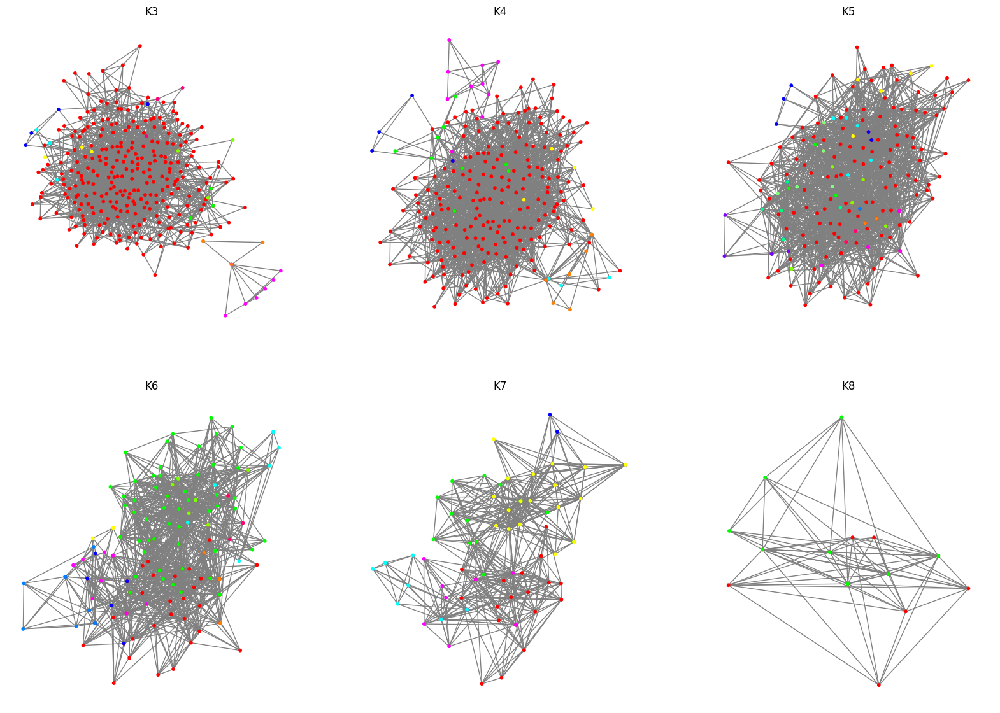

In [55]:
fig, axes = plt.subplots(2, 3, figsize=(20, 14))

pos = nx.kamada_kawai_layout(G)
for k in range(3, 9):
    K = nx.community.k_clique_communities(G, k)
    K = list(K)
    # high contrast colors, 1-15
    colors = [
        "#ff0000",
        "#00ff00",
        "#0000ff",
        "#ffff00",
        "#ff00ff",
        "#00ffff",
        "#ff8000",
        "#ff0080",
        "#80ff00",
        "#0080ff",
        "#8000ff",
        "#00ff80",
        "#80ff80",
        "#ff8080",
        "#8080ff",
    ]
    for i, c in enumerate(K):
        nx.draw(
            G.subgraph(c),
            pos,
            ax=axes.flat[k - 3],
            node_size=10,
            node_color=[colors[i] for _ in c],
            edge_color="gray",
            with_labels=False,
        )
    axes.flat[k - 3].set_title(f"K{k}")


Text(0.5, 0.98, 'K7')

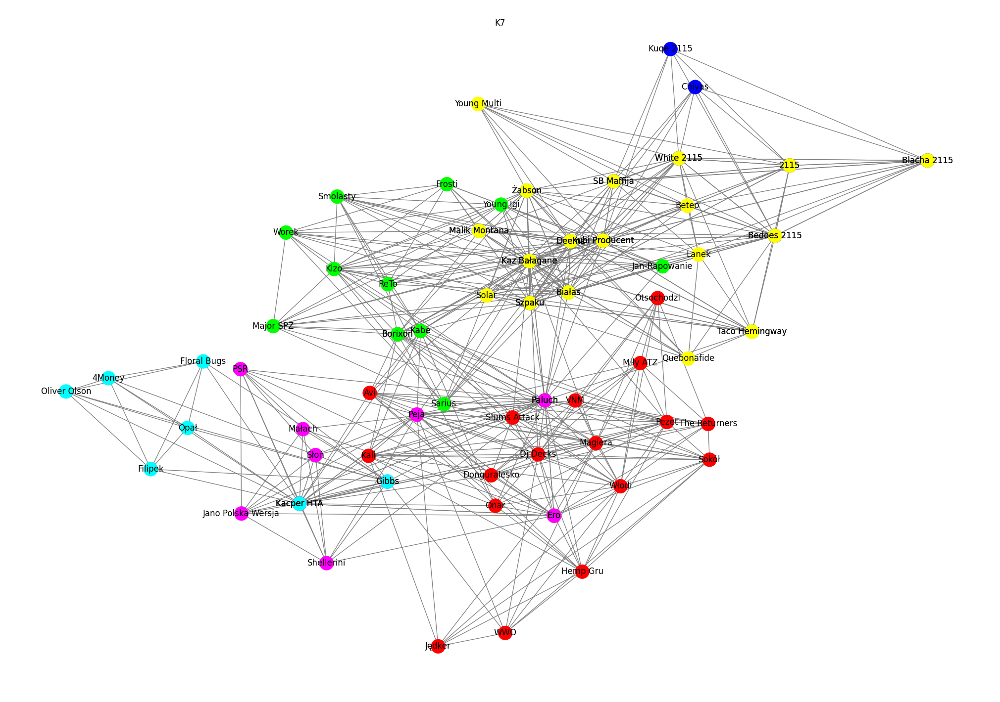

In [56]:
# only for 7
fig = plt.figure(figsize=(20, 14))
K = nx.community.k_clique_communities(G, 7)
K = list(K)
colors = [
    "#ff0000",
    "#00ff00",
    "#0000ff",
    "#ffff00",
    "#ff00ff",
    "#00ffff",
    "#ff8000",
    "#ff0080",
    "#80ff00",
    "#0080ff",
    "#8000ff",
    "#00ff80",
    "#80ff80",
    "#ff8080",
    "#8080ff",
]
for i, c in enumerate(K):
    nx.draw(
        G.subgraph(c),
        pos,
        node_size=400,
        node_color=[colors[i] for _ in c],
        edge_color="gray",
        with_labels=True,
    )
fig.suptitle("K7")


### Modularity-based communities

In [57]:
gmc = nx.community.greedy_modularity_communities(G, weight="collaboration_count")
len(gmc)

118

In [58]:
[len(c) for c in gmc][:20]

[84, 62, 60, 39, 35, 21, 21, 19, 13, 9, 7, 7, 7, 4, 3, 2, 2, 2, 2, 1]

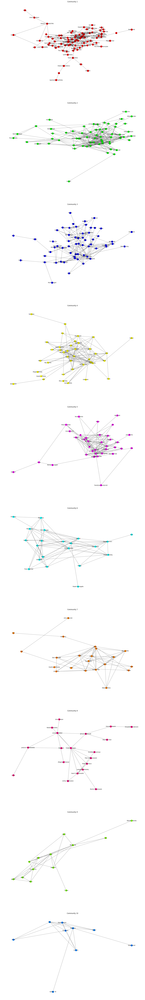

In [72]:
# plot the gmc
fig, axes = plt.subplots(10, 1, figsize=(20, 140))

pos = nx.kamada_kawai_layout(G)
for i, c in enumerate(gmc[:10]):
    nx.draw(
        G.subgraph(c),
        pos,
        ax=axes[i],
        node_size=200,
        node_color=colors[i],
        edge_color="gray",
        with_labels=True,
        font_size=10,
    )
    axes[i].set_title(f"Community {i + 1}")


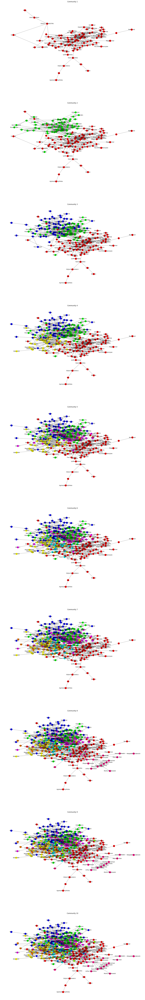

In [137]:
# plot the communities adding one more every time
fig, axes = plt.subplots(10, 1, figsize=(20, 140))

pos = nx.kamada_kawai_layout(G)
for i, c in enumerate(gmc[:10]):
    for j, c2 in enumerate(gmc[:i+1]):
        nx.draw(
            G.subgraph(c2),
            pos,
            ax=axes[i],
            node_size=200,
            node_color=colors[j],
            edge_color="gray",
            with_labels=True,
            font_size=10,
        )
        axes[i].set_title(f"Community {i + 1}")



### Label propagation

In [85]:
alc = nx.community.asyn_lpa_communities(G)
lpm = nx.community.label_propagation_communities(G)
flpc = nx.community.fast_label_propagation_communities(G)


In [95]:
alc = [list(c) for c in alc]
len(alc), sorted([len(c) for c in alc], reverse=True)[:10]


(116, [356, 8, 4, 3, 3, 3, 2, 2, 2, 2])

In [99]:
lpm = [list(c) for c in lpm]
len(lpm), sorted([len(c) for c in lpm], reverse=True)[:10]

(118, [177, 121, 53, 12, 3, 3, 3, 3, 3, 3])

In [102]:
flpc = [list(c) for c in flpc]
len(flpc), sorted([len(c) for c in flpc], reverse=True)[:10]

(108, [369, 8, 6, 4, 3, 3, 2, 2, 2, 1])

### Louvain

In [104]:
lv = nx.community.louvain_communities(G)
len(lv), sorted([len(c) for c in lv], reverse=True)[:10]

(111, [86, 80, 59, 53, 47, 29, 13, 12, 9, 6])

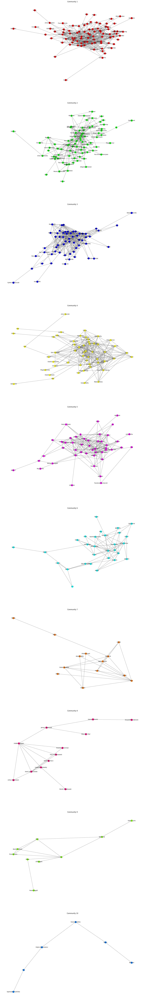

In [107]:
# plot top communities in louvain
fig, axes = plt.subplots(10, 1, figsize=(20, 140))

pos = nx.kamada_kawai_layout(G)
for i, c in enumerate(sorted(lv, key=len, reverse=True)[:10]):
    nx.draw(
        G.subgraph(c),
        pos,
        ax=axes[i],
        node_size=200,
        node_color=colors[i],
        edge_color="gray",
        with_labels=True,
        font_size=10,
    )
    axes[i].set_title(f"Community {i + 1}")

### Girvan newman

In [121]:
gn = nx.community.girvan_newman(G)

mod = []
for c in gn:
    mod.append((c, nx.community.modularity(G, c)))
best_mod = sorted(mod, key=lambda x: x[1], reverse=True)[0]
best_mod

(({'Arthur Rubinstein',
   'Frédéric Chopin',
   'Karol Szymanowski',
   'Krystian Zimerman',
   'Leopold Godowsky',
   'Moritz Moszkowski',
   'Piotr Anderszewski',
   'Rafał Blechacz'},
  {'C-BooL', 'Roxie Węgiel', 'Tribbs'},
  {'Avi',
   'Bonson',
   'Borixon',
   'Chada',
   'Dj Decks',
   'Donguralesko',
   'Ero',
   'Favst',
   'Filipek',
   'Gibbs',
   'HAŁASTRA',
   'Kabe',
   'Kacper HTA',
   'Kali',
   'Kukon',
   'Louis Villain',
   'Magiera',
   'Major SPZ',
   'Matheo',
   'Miły ATZ',
   'Onar',
   'Paluch',
   'Pawbeats',
   'Peja',
   'Pezet',
   'Sarius',
   'Slums Attack',
   'Sobota',
   'Sokół',
   'TEDE',
   'The Returners',
   'VNM',
   'Włodi',
   'przyłu'},
  {'@atutowy',
   'Bedoes 2115',
   'Białas',
   'CatchUp',
   'Chris Carson',
   'Deemz',
   'Deys',
   'Dwa Sławy',
   'Frosti',
   'Gedz',
   'Holak',
   'Jan-Rapowanie',
   'Janusz Walczuk',
   'Kaz Bałagane',
   'Kizo',
   'Kronkel Dom',
   'Kubi Producent',
   'Lanek',
   'Malik Montana',
   'Mata',
   '

In [139]:
len(best_mod[0]), [len(x) for x in sorted(best_mod[0], key=len, reverse=True)[:15]]

(318, [46, 34, 9, 9, 8, 8, 8, 6, 6, 6, 5, 5, 4, 4, 4])

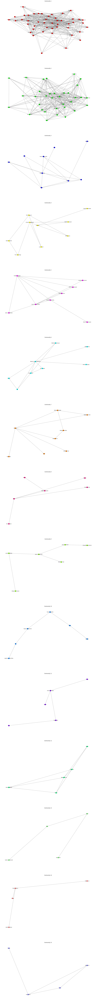

In [126]:
# top 15 communities in best modularity
fig, axes = plt.subplots(15, 1, figsize=(20, 210))

pos = nx.kamada_kawai_layout(G)
for i, c in enumerate(sorted(best_mod[0], key=len, reverse=True)[:15]):
    nx.draw(
        G.subgraph(c),
        pos,
        ax=axes[i],
        node_size=200,
        node_color=colors[i],
        edge_color="gray",
        with_labels=True,
        font_size=10,
    )
    axes[i].set_title(f"Community {i + 1}")


Text(0.5, 0.98, 'Top 15 communities by modularity')

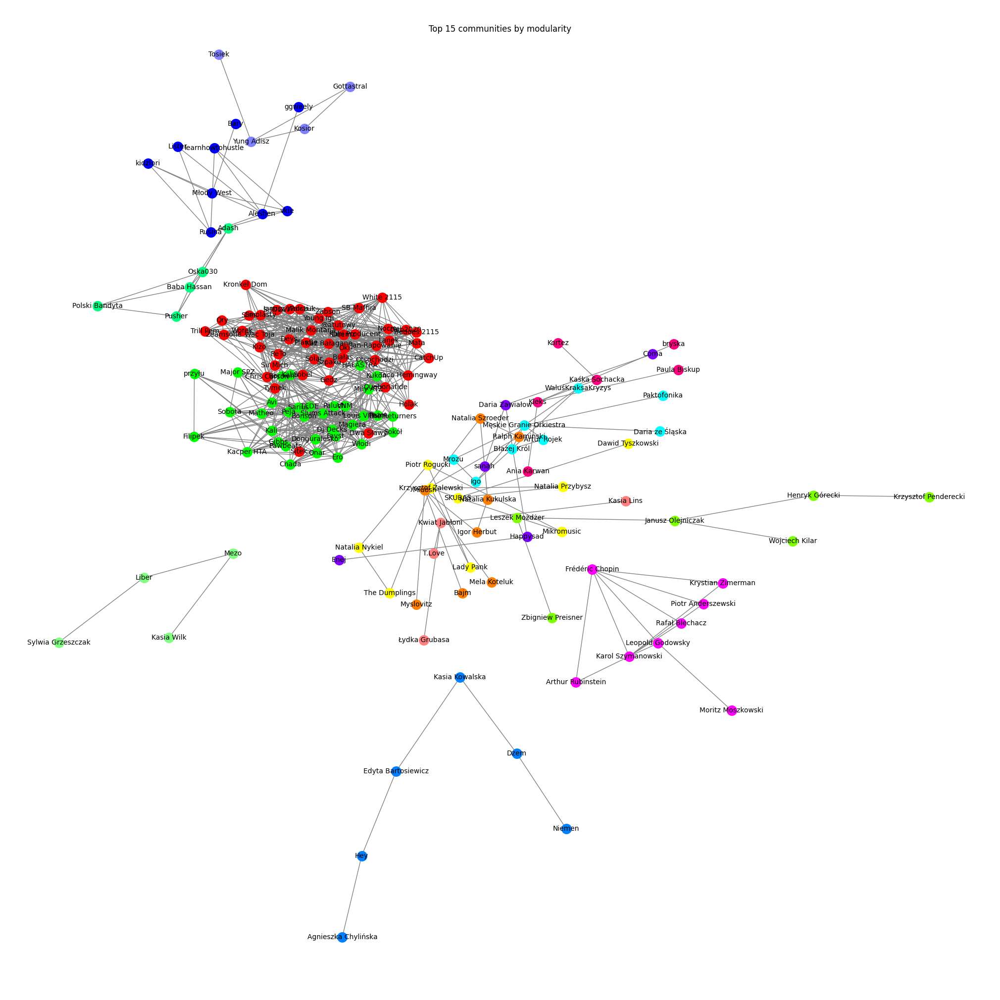

In [130]:
# plot all 15 at once
fig = plt.figure(figsize=(20, 20))
pos = nx.kamada_kawai_layout(G)
for i, c in enumerate(sorted(best_mod[0], key=len, reverse=True)[:15]):
    nx.draw(
        G.subgraph(c),
        pos,
        node_size=200,
        node_color=colors[i],
        edge_color="gray",
        with_labels=True,
        font_size=10,
    )
fig.suptitle("Top 15 communities by modularity")



## Wnioski

### K clique
Dzięki działaniu na sumach zbiorów podobnych klik, możemy znaleźć małe kliki, które można rekomendować jako potencjalni artyści, jednocześnie część artystów należy do kilku community, więc możmey rekomendować artystów spoza jednej małej społeczności.

### Modularity based communities
Algorytm `greedy_modularity_communities` był w stanie wyodrębnić wiele różnej wielkości społeczności. Jednak przy bliżeszj analizie, z wykorzystaniem wiedzy eksperckiej, społeczności te są zwykle za duże i różnica w stylach artystów oraz tworzonej przez nich utwrów jest bardzo duża. Stawia to pytanie, czy rekomendacje na podstawie samych kolaboracji są sensowne.
Ze względu na złożoność `O(n^4)` algorytmu `naive_greedy_modularity_communities`, nie testowaliśmy jego wyników.

### Label propagation
W najlepszym przypadku algorytm dzielił graf na 3 względnie duże społeczności, posiadając dziesiątki społeczności o wielkości 1/2/3.

### Louvain
Tu sytuacja wygląda podobnie co w społecznościach wygeneropwanych w algorytmach bazowanych na modularity, z tą róznicą, że jest tych społeczności więcek. Mimo wszystko problemy zostają takie same.

### Girvan newman
Przy analizie wzieliśmy społeczności dające największe modularity. Algorytm zwrócił duyżo więcej społeczności niż pozostałe algorytmy, nadal zsotawiając 2 stosukowo duże, które odpowiadały za dużą cześć krawędzi i jak poporzednio, przy konfontacji z więdzą dziedzinową nie były to najlepsze wyniki, choć pozostaje tu pole do pracy.


## Podsumowanie
Próba rekomendacji wykonawców na podstawie kolaboracji napotyka wiele problemów:
* Duża część twoórców wydaje sama, co uniemożliwia rekomendacje
* Często współpracę wychodzą poza ten sam gatunek muzyczny, więc próba przypisania twórcy do jednej społeczności nie odzwierciedla rzeczywistości
* Jedynym gatunkiem muzycznym, gdzie kolaborację występują często, jest hip-hop i rap; Jest to swoiste dla tego środowiska, więc są to jedyne gatunki muzyczne przy których można próbować przeprowadzić rekomendacje
* Jedynym użytecznym przetestowanym algorytmem może być K-clique, która przypisuje artystów do wielu społeczności i łączy je na podstawie podobieństwa